<a href="https://colab.research.google.com/github/CyberMaryVer/SignLanguageProcessing/blob/master/try_gki.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import io
import pandas as pd
import json
from google.colab import files

# uploaded = files.upload()
df = pd.read_json(io.StringIO(uploaded.get('test.json').decode('utf-8')))
df

,version,people
0,1.3,"{'person_id': [-1], 'pose_keypoints_2d': [619...."


In [ ]:
kps = df.people.values[0]
for k in kps.keys():
  print(k)
  print(len(kps[k]))

person_id
1
pose_keypoints_2d
75
face_keypoints_2d
210
hand_left_keypoints_2d
63
hand_right_keypoints_2d
63
pose_keypoints_3d
0
face_keypoints_3d
0
hand_left_keypoints_3d
0
hand_right_keypoints_3d
0


In [ ]:
!ffmpeg -i openpose.avi output.mp4

ffmpeg version 3.4.8-0ubuntu0.2 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7 (Ubuntu 7.5.0-3ubuntu1~18.04)
  configuration: --prefix=/usr --extra-version=0ubuntu0.2 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --enable-gpl --disable-stripping --enable-avresample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librubberband --enable-librsvg --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvorbis --enable-libvpx --enable-libwavpack --enable-libwebp --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lib

In [ ]:
from IPython.display import HTML
from base64 import b64encode
mp4 = open('output.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

In [ ]:
HTML("""
<video controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

# MEDIAPIPE HOLISTIC inference on video

In [1]:
! pip install mediapipe
! pip install youtube-dl
! pip install ffmpeg

     |████████████████████████████████| 32.2MB 93kB/s 


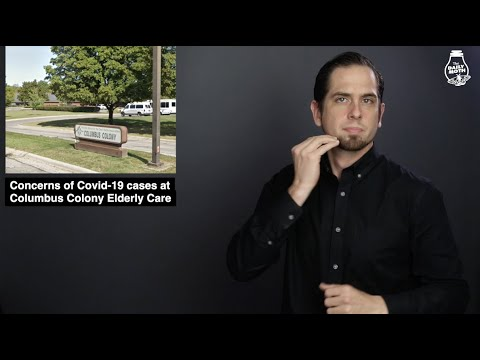

In [2]:
# This is the video we're going to process
from IPython.display import YouTubeVideo, display

DESIRED_HEIGHT = 480
DESIRED_WIDTH = 480
FOLDER = "images"
YOUTUBE_ID = "LtVZfkxGME4"
VIDEO_OUT = "video.mp4"

video = YouTubeVideo(YOUTUBE_ID, width=500)
display(video)

In [3]:
! youtube-dl https://www.youtube.com/watch?v=$YOUTUBE_ID -f 22 -o video_.mp4
! ffmpeg -i video_.mp4 -ss 00:00:47 -t 15 -c:v copy $VIDEO_OUT
! rm video_.mp4
! mkdir $FOLDER
! ffmpeg -i $VIDEO_OUT -r 4/1 $FOLDER/frame%03d.jpg

     |████████████████████████████████| 1.9MB 5.1MB/s 
  Created wheel for ffmpeg: filename=ffmpeg-1.4-cp37-none-any.whl size=6084 sha256=8b9518911b304c86f60778d8274088e1ca454a8e7955f4acf174794601bfeab0
  Stored in directory: /root/.cache/pip/wheels/b6/68/c3/a05a35f647ba871e5572b9bbfc0b95fd1c6637a2219f959e7a
Successfully built ffmpeg
[youtube] LtVZfkxGME4: Downloading webpage
[download] Destination: video_.mp4
[download] 100% of 47.08MiB in 00:07
ffmpeg version 3.4.8-0ubuntu0.2 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7 (Ubuntu 7.5.0-3ubuntu1~18.04)
  configuration: --prefix=/usr --extra-version=0ubuntu0.2 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --enable-gpl --disable-stripping --enable-avresample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribid

In [22]:
# !rm -r imgs2/

In [7]:
import cv2
from google.colab.patches import cv2_imshow
import math
import numpy as np
import os

def resize_image(image, show=False):
  h, w = image.shape[:2]
  if h < w:
    img = cv2.resize(image, (DESIRED_WIDTH, math.floor(h/(w/DESIRED_WIDTH))))
  else:
    img = cv2.resize(image, (math.floor(w/(h/DESIRED_HEIGHT)), DESIRED_HEIGHT))
  if show:
    cv2_imshow(img)

def read_and_resize(folder):
  # Read and resize images in the folder
  frames = [f"/content/{folder}/{img_name}" for img_name in os.listdir(folder)]
  # Read images with OpenCV.
  images = {name: cv2.imread(name) for name in frames}
  # Preview the images.
  for name, image in images.items():
    # print(name)
    resize_image(image)
  print(f"{len(images)} images in the folder")
  return images

In [12]:
images = read_and_resize("images")

62 images in the folder


In [8]:
import mediapipe as mp
mp_holistic = mp.solutions.holistic

# help(mp_holistic.Holistic)

In [9]:
# Prepare DrawingSpec for drawing the face landmarks later.
mp_drawing = mp.solutions.drawing_utils 
drawing_spec = mp_drawing.DrawingSpec(thickness=1, circle_radius=1)

In [20]:
! rm -r res/
! mkdir res

In [21]:
from tqdm.notebook import tqdm

# Run MediaPipe Holistic and draw pose landmarks.
with mp_holistic.Holistic(
    static_image_mode=False, 
    min_detection_confidence=0.5, 
    model_complexity=2, 
    min_tracking_confidence=.8) as holistic:
    
  for name, image in tqdm(images.items()):
    # Convert the BGR image to RGB and process it with MediaPipe Pose.
    results = holistic.process(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

    # Draw pose landmarks.
    # print(f'Pose landmarks of {name}:')
    annotated_image = image.copy()
    mp_drawing.draw_landmarks(annotated_image, results.left_hand_landmarks, mp_holistic.HAND_CONNECTIONS)
    mp_drawing.draw_landmarks(annotated_image, results.right_hand_landmarks, mp_holistic.HAND_CONNECTIONS)
    mp_drawing.draw_landmarks(
        image=annotated_image, 
        landmark_list=results.face_landmarks, 
        connections=mp_holistic.FACE_CONNECTIONS,
        landmark_drawing_spec=drawing_spec,
        connection_drawing_spec=drawing_spec)
    mp_drawing.draw_landmarks(
        image=annotated_image, 
        landmark_list=results.pose_landmarks, 
        connections=mp_holistic.POSE_CONNECTIONS,
        landmark_drawing_spec=drawing_spec,
        connection_drawing_spec=drawing_spec)
    resize_image(annotated_image, False)

    # Save frame
    short_name = name.split("/")[-1]
    print(f"/content/res/{short_name}", annotated_image.shape)
    cv2.imwrite(f"/content/res/{short_name}", annotated_image)

/content/res/frame015.jpg (720, 1280, 3)
/content/res/frame050.jpg (720, 1280, 3)
/content/res/frame047.jpg (720, 1280, 3)
/content/res/frame053.jpg (720, 1280, 3)
/content/res/frame001.jpg (720, 1280, 3)
/content/res/frame014.jpg (720, 1280, 3)
/content/res/frame062.jpg (720, 1280, 3)
/content/res/frame048.jpg (720, 1280, 3)
/content/res/frame052.jpg (720, 1280, 3)
/content/res/frame033.jpg (720, 1280, 3)
/content/res/frame044.jpg (720, 1280, 3)
/content/res/frame027.jpg (720, 1280, 3)
/content/res/frame043.jpg (720, 1280, 3)
/content/res/frame040.jpg (720, 1280, 3)
/content/res/frame002.jpg (720, 1280, 3)
/content/res/frame049.jpg (720, 1280, 3)
/content/res/frame029.jpg (720, 1280, 3)
/content/res/frame055.jpg (720, 1280, 3)
/content/res/frame060.jpg (720, 1280, 3)
/content/res/frame034.jpg (720, 1280, 3)
/content/res/frame004.jpg (720, 1280, 3)
/content/res/frame005.jpg (720, 1280, 3)
/content/res/frame018.jpg (720, 1280, 3)
/content/res/frame037.jpg (720, 1280, 3)
/content/res/fra

In [19]:
! ffmpeg -framerate 5 -pattern_type glob -i '/content/res/frame*.jpg' \
-c:v libx264 -vf fps=5 -pix_fmt yuv420p out.mp4
! rm -r $FOLDER

ffmpeg version 3.4.8-0ubuntu0.2 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7 (Ubuntu 7.5.0-3ubuntu1~18.04)
  configuration: --prefix=/usr --extra-version=0ubuntu0.2 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --enable-gpl --disable-stripping --enable-avresample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librubberband --enable-librsvg --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvorbis --enable-libvpx --enable-libwavpack --enable-libwebp --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lib